<a href="https://colab.research.google.com/github/enscully/AWS_Geospatial/blob/main/SurfaceWaterMappingTutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://githubtocolab.com/giswqs/geemap/blob/master/examples/notebooks/surface_water_mapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/></a>

Uncomment the following line to install [geemap](https://geemap.org) if needed.

#  Mapping surface water dynamics using Earth Engine


Author: Qiusheng Wu ([Website](https://wetlands.io) - [GitHub](https://github.com/giswqs))

**Keyboard shortcuts for Jupyter notebook:**

- **Shift-Enter**: run cell, select below
- **Ctrl-Enter**: run selected cells
- **Alt-Enter**: run cell and insert below
- **Ctrl-/**: comment
- **Tab**: code completion or indent
- **Shift-Tab**: tooltip

<h1>Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Install-geemap" data-toc-modified-id="Install-geemap-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Install geemap</a></span></li><li><span><a href="#Get-help" data-toc-modified-id="Get-help-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Get help</a></span></li><li><span><a href="#Create-an-interactive-map" data-toc-modified-id="Create-an-interactive-map-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Create an interactive map</a></span></li><li><span><a href="#Create-Landsat-timelapse" data-toc-modified-id="Create-Landsat-timelapse-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Create Landsat timelapse</a></span></li><li><span><a href="#Select-the-best-cloud-free-image" data-toc-modified-id="Select-the-best-cloud-free-image-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Select the best cloud-free image</a></span></li><li><span><a href="#Get-image-properties" data-toc-modified-id="Get-image-properties-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Get image properties</a></span></li><li><span><a href="#Calculate-NDWI" data-toc-modified-id="Calculate-NDWI-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Calculate NDWI</a></span></li><li><span><a href="#Extract-water" data-toc-modified-id="Extract-water-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Extract water</a></span></li><li><span><a href="#Convert-raster-to-vector" data-toc-modified-id="Convert-raster-to-vector-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Convert raster to vector</a></span></li><li><span><a href="#Apply-the-algorithm-to-all-images" data-toc-modified-id="Apply-the-algorithm-to-all-images-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Apply the algorithm to all images</a></span></li><li><span><a href="#Create-a-split-panel-map-to-visualize-results" data-toc-modified-id="Create-a-split-panel-map-to-visualize-results-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Create a split-panel map to visualize results</a></span></li><li><span><a href="#Export-results-to-Google-Drive" data-toc-modified-id="Export-results-to-Google-Drive-12"><span class="toc-item-num">12&nbsp;&nbsp;</span>Export results to Google Drive</a></span></li><li><span><a href="#Large-scale-surface-water-mapping" data-toc-modified-id="Large-scale-surface-water-mapping-13"><span class="toc-item-num">13&nbsp;&nbsp;</span>Large-scale surface water mapping</a></span></li><li><span><a href="#Use-JRC-Global-Surface-Water-Product" data-toc-modified-id="Use-JRC-Global-Surface-Water-Product-14"><span class="toc-item-num">14&nbsp;&nbsp;</span>Use JRC Global Surface Water Product</a></span></li></ul></div>

## Install geemap

To follow this tutorial, you need to install the [geemap](https://github.com/giswqs/geemap) Python package.Uncomment the following line to install and update the package to the latest version (v0.7.3).

In [ ]:
!pip install -U geemap -q

Check package version.

In [2]:
import ee
import geemap

In [3]:
print(ee.__version__)

0.1.346


In [4]:
print(geemap.__version__)

0.20.3


## Get help

- [Earth Engine API Documentation](https://developers.google.com/earth-engine/)
- [geeamp API Documentation](https://geemap.readthedocs.io/en/latest/source/geemap.html#geemap-package)
- [Report a geemap bug or submit a feature request](https://github.com/giswqs/geemap/issues)

In [ ]:
geemap.api_docs()

In [ ]:
geemap.open_youtube()

In [ ]:
geemap.ee_search()

## Create an interactive map

In [7]:
Map = geemap.Map(center=[40, -100], zoom=4)
Map.add_basemap('HYBRID')
Map

Map(center=[40, -100], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(T…

## Create Landsat timelapse

Use the Drawing tool to draw any rectangle on the map.

https://earthengine.google.com/timelapse/

https://geemap.readthedocs.io/en/latest/source/geemap.html#geemap.geemap.Map.add_landsat_ts_gif

In [8]:
Map.setCenter(-114.762293, 36.06462, 9)
# roi = ee.Geometry.Point([-114.762293, 36.06462])

In [9]:
roi = Map.draw_last_feature
roi

In [10]:
label = 'Surface water dynamics in Lake Mead'
Map.add_landsat_ts_gif(
    label=label,
    roi = roi,
    start_year=1985,
    end_year = 2023,
    bands=['NIR', 'Red', 'Green'],
    font_color='white',
    frames_per_second=10,
    progress_bar_color='blue',
)

Generating URL...
Please wait ...
The GIF image has been saved to: /tmp/f0abb209-82c7-4166-81b0-2c2343000d24.gif
Adding GIF to the map ...
The timelapse has been added to the map.


## Select the best cloud-free image

In this case study, we can going to use [USGS Landsat 8 Surface Reflectance Tier 1](https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC08_C01_T1_SR).

- `ee.ImageCollection("LANDSAT/LC08/C01/T1_SR")`

In [11]:
Map = geemap.Map()
Map.add_basemap('HYBRID')
Map.setCenter(-114.762293, 36.06462, 9)
Map

Map(center=[36.06462, -114.762293], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBo…

Pan and zoom the map to Lake Mead near Las Vegas, NV. Use the Drawing Tools to place a marker inside Lake Mead.

In [12]:
roi = Map.user_roi
print(roi.getInfo())

{'type': 'Point', 'coordinates': [-114.420184, 36.155618]}


Alternatively, you can define an ee.Geometry() as an ROI.

In [ ]:
roi = ee.Geometry.Point([-114.762293, 36.06462])

Let's filter the ImageCollection by roi and date, and then sort by cloud cover.

In [15]:
images = (
    ee.ImageCollection('LANDSAT/LC08/C01/T1_SR')
    .filterBounds(roi)
    .filterDate('2000-01-01', '2023-12-31')
    .sort('CLOUD_COVER')
)

How many Landsat 8 images (2015-2019) are available for the study area?

In [14]:
print(images.size().getInfo())

158


Since the returned images are already sorted by CLOUD_COVER in ascending order, the first image would be the best cloud-free image.

In [16]:
# best_image = images.toList(images.size()).get(0)
best_image = images.first().select(['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7'])

Let's add the best image to the Map.

In [17]:
vis_params = {
    'bands': ['B5', 'B4', 'B3'],
    'min': 0,
    'max': 6000,
    'gamma': 1.4,
}
Map.addLayer(best_image, vis_params, 'Best image')

Use the Inspector and Plotting to check pixel values and spectral signature.

## Get image properties

In [ ]:
print(best_image.getInfo())

{'type': 'Image', 'bands': [{'id': 'B1', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': -32768, 'max': 32767}, 'dimensions': [7601, 7731], 'crs': 'EPSG:32611', 'crs_transform': [30, 0, 584085, 0, -30, 4106415]}, {'id': 'B2', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': -32768, 'max': 32767}, 'dimensions': [7601, 7731], 'crs': 'EPSG:32611', 'crs_transform': [30, 0, 584085, 0, -30, 4106415]}, {'id': 'B3', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': -32768, 'max': 32767}, 'dimensions': [7601, 7731], 'crs': 'EPSG:32611', 'crs_transform': [30, 0, 584085, 0, -30, 4106415]}, {'id': 'B4', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': -32768, 'max': 32767}, 'dimensions': [7601, 7731], 'crs': 'EPSG:32611', 'crs_transform': [30, 0, 584085, 0, -30, 4106415]}, {'id': 'B5', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': -32768, 'max': 32767}, 'dimensions': [7601, 7731], 'crs': 'EPSG:32611', 'crs_transform': [30, 0, 5840

In [ ]:
print(best_image.propertyNames().getInfo())

['IMAGE_QUALITY_TIRS', 'CLOUD_COVER', 'system:id', 'EARTH_SUN_DISTANCE', 'LANDSAT_ID', 'system:footprint', 'system:version', 'CLOUD_COVER_LAND', 'GEOMETRIC_RMSE_MODEL', 'SR_APP_VERSION', 'SATELLITE', 'SOLAR_AZIMUTH_ANGLE', 'IMAGE_QUALITY_OLI', 'WRS_PATH', 'system:time_start', 'SENSING_TIME', 'ESPA_VERSION', 'SOLAR_ZENITH_ANGLE', 'WRS_ROW', 'GEOMETRIC_RMSE_MODEL_Y', 'LEVEL1_PRODUCTION_DATE', 'GEOMETRIC_RMSE_MODEL_X', 'system:asset_size', 'PIXEL_QA_VERSION', 'system:index', 'system:bands', 'system:band_names']


In [ ]:
print(best_image.get('system:id').getInfo())

LANDSAT/LC08/C01/T1_SR/LC08_039035_20150724


In [18]:
image = ee.Image('LANDSAT/LC08/C01/T1_SR/LC08_039035_20150724')
vis_params = {
    'bands': ['B6', 'B5', 'B4'],
    'min': 0,
    'max': 6000,
    'gamma': 1.4,
}
Map.addLayer(image, vis_params, 'image')
Map

Map(bottom=51741.0, center=[36.06462, -114.762293], controls=(WidgetControl(options=['position', 'transparent_…

In [19]:
print(best_image.get('CLOUD_COVER').getInfo())

0


In [20]:
print(best_image.get('system:band_names').getInfo())

['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7']


In [21]:
print(best_image.get('system:time_start').getInfo())

1437761710440


In [22]:
print(ee.Date(best_image.get('system:time_start')).format('YYYY-MM-dd').getInfo())

2015-07-24


In [23]:
print(
    "WRS_Path={}, WRS_ROW={}".format(
        best_image.get('WRS_PATH').getInfo(), best_image.get('WRS_ROW').getInfo()
    )
)

WRS_Path=39, WRS_ROW=35


## Calculate NDWI

The Normalized Difference Water Index (NDWI) is used to monitor changes related to water content in water bodies, using green and NIR wavelengths, defined by McFeeters (1996):

![](https://wikimedia.org/api/rest_v1/media/math/render/svg/fd21ea077007b78b7bf753498d4953991837cb26)

In [24]:
Map = geemap.Map()
Map

Map(center=[20, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Togg…

In [25]:
image = ee.Image('LANDSAT/LC08/C01/T1_SR/LC08_039035_20150724')
vis_params = {
    'bands': ['B5', 'B4', 'B3'],
    'min': 0,
    'max': 6000,
    'gamma': 1.4,
}
Map.addLayer(image, vis_params, 'image')
Map.centerObject(image, 8)

In [26]:
ndwi_image = image.normalizedDifference(['B3', 'B5'])

In [27]:
vis_ndwi = {
    'min': -1,
    'max': 1,
    'palette': [
        '#ece7f2',
        '#d0d1e6',
        '#a6bddb',
        '#74a9cf',
        '#3690c0',
        '#0570b0',
        '#045a8d',
        '#023858',
    ],
}
Map.addLayer(ndwi_image, vis_ndwi, 'NDWI image')

## Extract water

In [28]:
ndwi_threshold = 0
water_image = ndwi_image.gt(ndwi_threshold).selfMask()

In [29]:
Map.addLayer(water_image, {'palette': 'blue'}, 'Water image')

In [30]:
Map.layers

(TileLayer(attribution='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors', base=True, max_zoom=19, min_zoom=1, name='OpenStreetMap.Mapnik', options=['attribution', 'bounds', 'detect_retina', 'max_native_zoom', 'max_zoom', 'min_native_zoom', 'min_zoom', 'no_wrap', 'tile_size', 'tms', 'zoom_offset'], url='https://tile.openstreetmap.org/{z}/{x}/{y}.png'),
 TileLayer(attribution='Google', max_zoom=22, name='Google Maps', options=['attribution', 'bounds', 'detect_retina', 'max_native_zoom', 'max_zoom', 'min_native_zoom', 'min_zoom', 'no_wrap', 'tile_size', 'tms', 'zoom_offset'], url='https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}'),
 TileLayer(attribution='Google Earth Engine', max_zoom=24, name='image', options=['attribution', 'bounds', 'detect_retina', 'max_native_zoom', 'max_zoom', 'min_native_zoom', 'min_zoom', 'no_wrap', 'tile_size', 'tms', 'zoom_offset'], url='https://earthengine.googleapis.com/v1alpha/projects/earthengine-legacy/maps/d57214e

In [31]:
water_layer = Map.layers[-1]

In [32]:
water_layer.interact(opacity=(0.0, 1.0, 0.1))

Box(children=(FloatSlider(value=1.0, description='opacity', max=1.0),))

In [33]:
Map

Map(bottom=26025.0, center=[36.042984907486655, -114.81519379965525], controls=(WidgetControl(options=['positi…

## Convert raster to vector

In [34]:
water_vector = water_image.reduceToVectors(scale=30, maxPixels=60000000)
Map.addLayer(water_vector, {}, 'Water vector')

In [37]:
roi = ee.Geometry.Point([-114.762293, 36.06462])
lake_mead = water_vector.filterBounds(roi)
Map.addLayer(lake_mead, {}, 'Lake Mead')

In [38]:
Map.addLayer(
    ee.Image().paint(lake_mead, 0, 2), {'palette': 'blue'}, 'Lake Mead Outline'
)

In [39]:
area = lake_mead.geometry().area(1).divide(1e6).round().getInfo()
print("Area = {} km2".format(area))

Area = 318 km2


## Apply the algorithm to all images

In [40]:
Map = geemap.Map()
Map

Map(center=[20, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Togg…

Define input parameters

In [44]:
roi = ee.Geometry.Point([-114.762293, 36.06462])
start_date = '2000-01-01'
end_date = '2023-12-31'
cloud_threshold = 0.10
ndwi_threshold = 0

In [45]:
images = (
    ee.ImageCollection('LANDSAT/LC08/C01/T1_SR')
    .filterBounds(roi)
    .filterDate(start_date, end_date)
    .filterMetadata('CLOUD_COVER', 'less_than', cloud_threshold)
)

In [46]:
print(images.size().getInfo())

34


In [47]:
print(images.aggregate_array('system:id').getInfo())

['LANDSAT/LC08/C01/T1_SR/LC08_039035_20130429', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20130531', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20131006', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20131022', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20140502', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20140603', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20140721', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20140923', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20141110', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20150724', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20151012', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20160710', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20160912', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20170526', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20170627', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20170814', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20171118', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20180411', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20180427', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20180918', 'LANDSAT/LC08/C01/T1_SR/LC08_039035_20181105', 'LANDSAT/LC0

In [48]:
dates = images.aggregate_array('system:time_start').map(
    lambda d: ee.Date(d).format('YYYY-MM-dd')
)
print(dates.getInfo())

['2013-04-29', '2013-05-31', '2013-10-06', '2013-10-22', '2014-05-02', '2014-06-03', '2014-07-21', '2014-09-23', '2014-11-10', '2015-07-24', '2015-10-12', '2016-07-10', '2016-09-12', '2017-05-26', '2017-06-27', '2017-08-14', '2017-11-18', '2018-04-11', '2018-04-27', '2018-09-18', '2018-11-05', '2019-08-20', '2019-09-21', '2019-10-07', '2019-11-08', '2020-06-19', '2020-07-05', '2020-08-06', '2020-09-23', '2020-10-25', '2021-04-19', '2021-05-05', '2021-08-09', '2021-10-28']


In [49]:
first_image = ee.Image(images.toList(images.size()).get(3))
vis_params = {
    'bands': ['B5', 'B4', 'B3'],
    'min': 0,
    'max': 6000,
    'gamma': 1.4,
}
Map.addLayer(first_image, vis_params, 'First image')
Map.centerObject(roi, 8)

In [50]:
def extract_water(img):

    ndwi_image = img.normalizedDifference(['B3', 'B5'])
    water_image = ndwi_image.gt(ndwi_threshold)
    return water_image

In [51]:
ndwi_images = images.map(extract_water)

In [52]:
first_ndwi_image = ee.Image(ndwi_images.toList(ndwi_images.size()).get(0)).selfMask()
Map.addLayer(first_ndwi_image, {'palette': 'blue'}, 'First NDWI')

In [53]:
occurrence = ndwi_images.sum().selfMask()
Map.addLayer(occurrence.randomVisualizer(), {}, 'Water occurrence')

In [54]:
def ras_to_vec(img):
    vec = img.selfMask().reduceToVectors(scale=30, maxPixels=60000000)
    vec = vec.filterBounds(roi)
    return vec.set({'area': vec.geometry().area(1).divide(1e6).round()})

In [55]:
ndwi_vectors = ndwi_images.map(ras_to_vec)

In [56]:
areas = ndwi_vectors.aggregate_array('area')
print(areas.getInfo())

[378, 369, 365, 363, 349, 340, 325, 330, 335, 318, 318, 311, 321, 328, 324, 321, 330, 333, 331, 319, 322, 329, 328, 328, 335, 336, 335, 331, 329, 328, 327, 321, 304, 311]


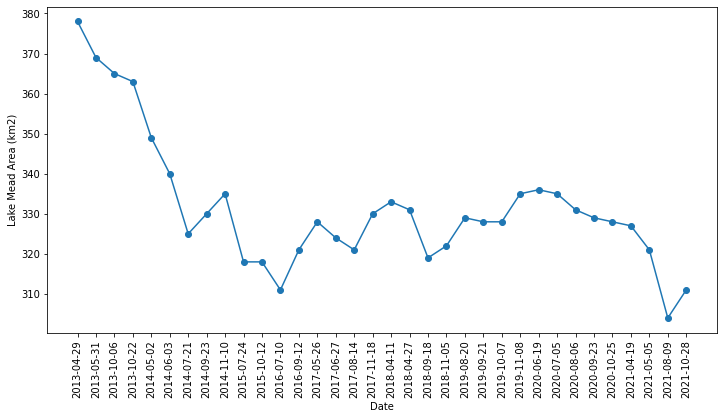

In [58]:
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib qt

fig = plt.figure(figsize=(12, 6))

x = dates.getInfo()
y = areas.getInfo()

plt.plot(x, y, marker='o')
plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Lake Mead Area (km2)')
plt.show()

## Create a split-panel map to visualize results

In [60]:
water_images = ndwi_images.map(lambda img: img.selfMask())
landsat_images = images

In [61]:
water_layer_names = ['Water ' + str(date) for date in x]

In [62]:
landsat_layer_names = ['Landsat ' + str(date) for date in x]

In [63]:
water_vis = {'palette': 'blue'}

landsat_vis = {
    'bands': ['B5', 'B4', 'B3'],
    'min': 0,
    'max': 6000,
    'gamma': 1.4,
}

In [64]:
Map = geemap.Map()
Map.ts_inspector(
    left_ts=water_images,
    right_ts=landsat_images,
    left_names=water_layer_names,
    right_names=landsat_layer_names,
    left_vis=water_vis,
    right_vis=landsat_vis,
)
Map.centerObject(roi, zoom=8)
Map

Map(center=[36.06462, -114.762293], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Dro…

In [65]:
layer_index = 16  # Change this index to your desired date
print("Image date: {}".format(x[layer_index]))

water_image = ee.Image(water_images.toList(water_images.size()).get(layer_index))
landsat_image = ee.Image(landsat_images.toList(landsat_images.size()).get(layer_index))


left_layer = geemap.ee_tile_layer(water_image, water_vis, 'Water')
right_layer = geemap.ee_tile_layer(landsat_image, landsat_vis, 'Landsat')

Map = geemap.Map()
Map.addLayer(landsat_image, landsat_vis, 'Landsat')
Map.split_map(left_layer, right_layer)
Map.centerObject(roi, zoom=12)
Map

Image date: 2017-11-18


Map(center=[36.06462, -114.762293], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

## Export results to Google Drive

In [ ]:
geemap.ee_export_image_collection_to_drive(water_images, folder='export', scale=90)

In [ ]:
geemap.ee_export_image_to_drive(
    occurrence.toInt(),
    description='water_occurrence',
    folder='export',
    region=first_ndwi_image.geometry(),
    scale=90,
)

## Large-scale surface water mapping

In [ ]:
import ee
import geemap

In [ ]:
Map = geemap.Map()
Map

In [ ]:
states_shp = geemap.shp_to_ee('../data/us_states.shp')
Map.addLayer(states_shp, {}, 'US States SHP')

In [ ]:
state_name = 'Nevada'
roi = ee.FeatureCollection('TIGER/2018/States').filter(ee.Filter.eq('NAME', state_name))
# roi = states_shp.filterBounds(Map.user_roi)
Map.addLayer(ee.Image().paint(roi, 0, 2), {'palette': 'red'}, state_name)

In [ ]:
images = geemap.landsat_timeseries(
    roi=roi, start_year=1984, end_year=2019, start_date='06-01', end_date='09-30'
)

In [ ]:
first_image = ee.Image(images.toList(images.size()).get(0))

In [ ]:
landsat_vis = {'bands': ['NIR', 'Red', 'Green'], 'min': 0, 'max': 3500}
Map.addLayer(first_image, landsat_vis, 'First image')

In [ ]:
layer_names = ['Landsat ' + str(year) for year in range(1984, 2020)]
Map = geemap.Map()
Map.ts_inspector(
    left_ts=images,
    right_ts=images,
    left_names=layer_names,
    right_names=layer_names,
    left_vis=landsat_vis,
    right_vis=landsat_vis,
)
Map.centerObject(roi, zoom=8)
Map

In [ ]:
ndwi_threshold = 0


def extract_water(img):

    ndwi_image = img.normalizedDifference(['Green', 'NIR'])
    water_image = ndwi_image.gt(ndwi_threshold)
    return water_image

In [ ]:
water_images = images.map(extract_water)

In [ ]:
Map = geemap.Map()

first_image = ee.Image(images.toList(images.size()).get(0))
landsat_vis = {'bands': ['NIR', 'Red', 'Green'], 'min': 0, 'max': 3500}
Map.addLayer(first_image, landsat_vis, 'First image')

first_water_image = ee.Image(water_images.toList(water_images.size()).get(0)).selfMask()
Map.addLayer(first_water_image, {'palette': 'blue'}, 'First NDWI')

Map

In [ ]:
layer_index = 0  # Change this index to your desired date
print(layer_names[layer_index])

water_image = ee.Image(
    water_images.toList(water_images.size()).get(layer_index)
).selfMask()
landsat_image = ee.Image(images.toList(images.size()).get(layer_index))

water_vis = {'palette': 'blue'}

landsat_vis = {
    'bands': ['NIR', 'Red', 'Green'],
    'min': 0,
    'max': 4000,
    'gamma': 1.4,
}

left_layer = geemap.ee_tile_layer(water_image, water_vis, 'Water')
right_layer = geemap.ee_tile_layer(landsat_image, landsat_vis, 'Landsat')

Map = geemap.Map()
Map.addLayer(landsat_image, landsat_vis, 'Landsat')
Map.split_map(left_layer, right_layer)
Map.centerObject(roi, zoom=12)
Map

## Use JRC Global Surface Water Product

In [ ]:
import ee
import geemap

In [ ]:
Map = geemap.Map()
Map.add_basemap('HYBRID')
Map

In [ ]:
gsw = ee.Image('JRC/GSW1_1/GlobalSurfaceWater')

In [ ]:
print(gsw.bandNames().getInfo())

In [ ]:
occurrence = gsw.select('occurrence')

In [ ]:
vis_occurrence = {'min': 0, 'max': 100, 'palette': ['red', 'blue']}

In [ ]:
Map.addLayer(occurrence, vis_occurrence, 'Occurrence')

In [ ]:
water_mask = occurrence.gt(90).selfMask()
vis_water_mask = {'palette': ['white', 'blue']}

In [ ]:
Map.addLayer(water_mask, vis_water_mask, 'Water Mask (>90%)')

In [ ]:
Map.setCenter(-74.4557, -8.4289, 11)
Map

In [ ]:
change = gsw.select("change_abs")

In [ ]:
vis_change = {'min': -50, 'max': 50, 'palette': ['red', 'black', 'limegreen']}

In [ ]:
Map.addLayer(change, vis_change, 'Occurrence change intensity')

In [ ]:
transition = gsw.select('transition')

In [ ]:
Map.addLayer(transition, {}, 'Transition classes')

In [ ]:
label = 'Surface Water Dynamics'
Map.add_landsat_ts_gif(
    label=label,
    start_year=1985,
    start_date='01-01',
    end_date='12-31',
    bands=['SWIR1', 'NIR', 'Red'],
    font_color='white',
    frames_per_second=10,
    progress_bar_color='blue',
)